In [1]:
%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc 
import sys 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sys.path.append('../../src')
import warnings
warnings.filterwarnings('ignore')

from spaceoracle.prophets import Prophet

2025-02-14 16:51:08.421106: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
adata_train = sc.read_h5ad(
    '/ix/djishnu/shared/djishnu_kor11/training_data_2025/mLND3-1_v4.h5ad')

In [4]:
tf = 'Pax5'
adata_train.layers['simulated_count'] = pd.read_parquet(
    f'/ix/djishnu/shared/djishnu_kor11/perturbations/mLDN3-1_v4/{tf}.parquet').values

delta_X = adata_train.layers['imputed_count'] - adata_train.layers['simulated_count']
adata_train.layers['delta_X'] = delta_X

In [5]:
pro = Prophet(
    adata=adata_train,
    models_dir='/ix/djishnu/shared/djishnu_kor11/super_filtered_runs/mLDN3-1_v4',
    annot='cell_type_int',
    annot_labels='cell_type',
    radius=100
)
pro.goi = tf

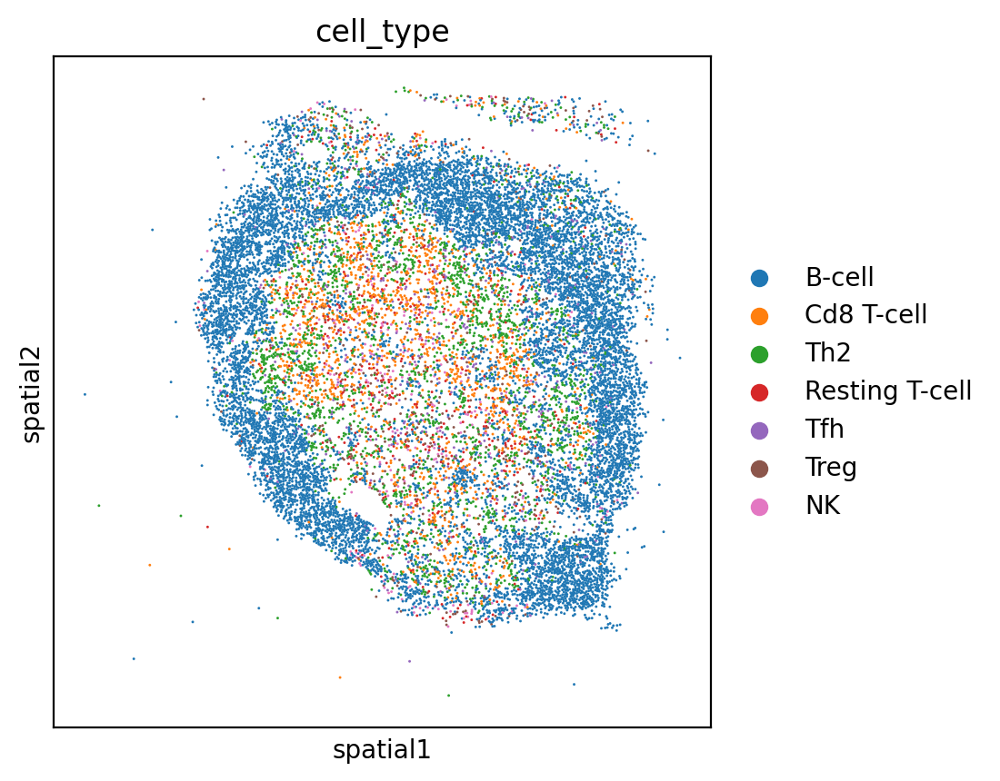

In [6]:
sc.pl.spatial(pro.adata, color=['cell_type'], spot_size=20)

In [ ]:
import json
with open('../../data/GSEA/m2.all.v2024.1.Mm.json', 'r') as f:
    gsea_modules = json.load(f)

In [ ]:
from spaceoracle.plotting.gsea import * 

gsea_scores = compute_gsea_scores(adata_train, gsea_modules)

Computing GSEA scores: 100%|██████████| 2710/2710 [12:39<00:00,  3.57it/s]


In [ ]:
adata_train.layers['simulated_count'] = pd.read_parquet(
    f'/ix/djishnu/shared/djishnu_kor11/perturbations/mLDN3-1_v4/{tf}.parquet').values

gsea_scores_perturbed = compute_gsea_scores(adata_train, gsea_modules, layer='simulated_count')

Computing GSEA scores: 100%|██████████| 2710/2710 [08:49<00:00,  5.12it/s]


In [ ]:
delta_gsea_scores = gsea_scores - gsea_scores_perturbed
delta_gsea_scores.dropna(inplace=True)
delta_gsea_scores

,AAAAAAAGCCAACA,AAAAAACGGTAGAT,AAAAAATCCGGCGA,AAAAACCGTCAGAC,AAAAACGCTCCGAC,AAAAAGCACGTGTT,AAAAAGCGGCGCAC,AAAAAGGAAAGAGC,AAAAAGGATCTTGA,AAAAAGTGATAGCA,...,TTTTTTATAATACC,TTTTTTCGCGGCTA,TTTTTTGGGCTGGT,TTTTTTGTACCCAC,TTTTTTGTACGATT,TTTTTTTATGGTAC,TTTTTTTGTCGCCT,TTTTTTTTATTATA,TTTTTTTTGCTTTA,score_var
FUJIWARA_PARK2_IN_LIVER_CANCER_DN,0.002536,0.001828,0.003314,0.002318,0.002169,0.002921,0.002704,0.002989,0.003334,0.002815,...,0.003016,0.003016,0.00266,0.002193,0.003165,0.000476,0.002243,0.002524,0.002277,0.000001
LANDIS_BREAST_CANCER_PROGRESSION_UP,-0.000496,-0.002291,-0.000022,-0.000886,-0.000845,-0.00035,-0.000949,-0.000121,-0.000982,-0.000314,...,-0.000652,-0.002149,-0.000146,-0.000625,-0.001198,-0.001373,-0.000764,-0.000419,-0.000384,0.000001
CHIARADONNA_NEOPLASTIC_TRANSFORMATION_KRAS_CDC25_UP,-0.003517,-0.005464,-0.000885,-0.00857,-0.004954,-0.007021,-0.00268,-0.010094,-0.001175,-0.001091,...,-0.011865,-0.002818,-0.001471,-0.001607,-0.006368,-0.002057,-0.003185,-0.003691,-0.005055,0.000033
CHIARADONNA_NEOPLASTIC_TRANSFORMATION_KRAS_CDC25_DN,-0.004139,-0.004848,-0.004491,-0.005921,-0.004739,-0.007199,-0.005413,-0.00748,-0.004952,-0.004925,...,-0.006215,-0.004967,-0.00559,-0.004716,-0.006863,-0.006895,-0.003047,-0.006366,-0.007334,0.0
CHIARADONNA_NEOPLASTIC_TRANSFORMATION_KRAS_UP,0.001026,-0.000136,0.000398,-0.000621,-0.000889,-0.001275,-0.000487,-0.002288,0.000074,0.000507,...,-0.004645,-0.000176,-0.000757,-0.000229,-0.000618,0.001175,-0.00074,0.001563,0.000897,0.000006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BIOCARTA_LIS1_PATHWAY,-0.007807,-0.011823,-0.007232,0.000988,0.001086,-0.003697,-0.001971,-0.006187,-0.002155,-0.000666,...,-0.002842,-0.008638,0.000042,0.001633,-0.003909,-0.012262,-0.002653,-0.001721,-0.008726,0.000014
BIOCARTA_LYMPHOCYTE_PATHWAY,0.016237,0.026347,0.018863,0.027328,0.023108,0.026366,0.021009,0.022529,0.024164,0.020261,...,0.024999,0.021728,0.021597,0.024761,0.023534,0.02291,0.016357,0.027495,0.029881,-0.000041
BIOCARTA_VOBESITY_PATHWAY,0.000116,-0.000363,-0.000158,0.000055,-0.00016,-0.00065,-0.000454,-0.000093,-0.000396,-0.000121,...,-0.000661,-0.000423,-0.000457,0.000123,-0.000535,-0.0012,0.000415,0.000067,-0.000443,-0.000005
BIOCARTA_BBCELL_PATHWAY,0.021443,0.023947,0.024842,0.034528,0.031962,0.032558,0.02826,0.032556,0.026805,0.029107,...,0.031744,0.025852,0.028696,0.029456,0.029109,0.028543,0.021511,0.031171,0.032525,-0.000029


In [ ]:
delta_gsea_scores['abs_var'] = delta_gsea_scores.iloc[:, :-1].apply(lambda row: np.abs(row.mean()), axis=1)
delta_gsea_scores.sort_values(by = 'abs_mean', ascending=False, inplace=True)
delta_gsea_scores

,AAAAAAAGCCAACA,AAAAAACGGTAGAT,AAAAAATCCGGCGA,AAAAACCGTCAGAC,AAAAACGCTCCGAC,AAAAAGCACGTGTT,AAAAAGCGGCGCAC,AAAAAGGAAAGAGC,AAAAAGGATCTTGA,AAAAAGTGATAGCA,...,TTTTTTGGGCTGGT,TTTTTTGTACCCAC,TTTTTTGTACGATT,TTTTTTTATGGTAC,TTTTTTTGTCGCCT,TTTTTTTTATTATA,TTTTTTTTGCTTTA,score_var,abs_mean,abs_var
BIOCARTA_THELPER_PATHWAY,0.095252,0.094075,0.058829,0.112561,0.080941,0.091659,0.0603,0.110851,0.053212,0.048358,...,0.059627,0.055187,0.095273,0.094926,0.056297,0.085301,0.115915,-0.001417,8.545706e-02,8.545157e-02
KAMMINGA_SENESCENCE,0.02367,0.033861,0.02897,0.037828,0.034742,0.034276,0.027781,0.03423,0.029283,0.027819,...,0.030512,0.027734,0.034366,0.038497,0.025534,0.035129,0.03845,-0.000049,3.266541e-02,3.266334e-02
WENG_POR_TARGETS_GLOBAL_UP,-0.028345,-0.037138,-0.033606,-0.030078,-0.028872,-0.031037,-0.03104,-0.029981,-0.02879,-0.029397,...,-0.03,-0.030546,-0.032457,-0.043217,-0.024501,-0.032038,-0.040266,0.000011,3.151480e-02,3.150883e-02
BAUS_TFF2_TARGETS_DN,0.021914,0.031666,0.02825,0.03498,0.032326,0.030343,0.026377,0.029954,0.029413,0.026465,...,0.029592,0.026427,0.032703,0.036106,0.024293,0.0326,0.034288,-0.000008,3.045025e-02,3.044833e-02
BIOCARTA_BBCELL_PATHWAY,0.021443,0.023947,0.024842,0.034528,0.031962,0.032558,0.02826,0.032556,0.026805,0.029107,...,0.028696,0.029456,0.029109,0.028543,0.021511,0.031171,0.032525,-0.000029,3.000991e-02,3.000801e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MEISSNER_BRAIN_ICP_WITH_H3K4ME3,0.000068,-0.000214,-0.000022,0.000036,-0.000027,0.000002,-0.000136,0.000005,0.000063,0.000089,...,-0.000032,-0.000114,0.000063,-0.000134,-0.000066,0.000011,-0.00025,0.0,2.146535e-06,2.146128e-06
DELACROIX_RAR_TARGETS_DN,0.000598,-0.000385,-0.000428,0.000247,-0.000043,0.000153,-0.000181,0.000122,-0.000217,-0.000056,...,-0.000277,-0.000077,-0.000088,0.000243,-0.000059,-0.000036,0.0003,-0.0,1.922094e-06,1.921734e-06
XIE_TRASTUZUMAB_CARDIOTOXICITY_MMU_MIR_150_5P_GENES,-0.000072,0.000867,0.000239,0.000199,0.000053,0.0007,-0.000476,0.00071,-0.000376,-0.000403,...,-0.000496,-0.000256,0.000131,0.000265,0.000313,0.000056,0.001314,-0.0,1.309228e-06,1.308998e-06
MEISSNER_ES_ICP_WITH_H3K4ME3,0.000031,0.000191,-0.000132,0.000016,0.000009,-0.000013,-0.000068,-0.000031,-0.000098,0.000081,...,-0.000006,-0.00006,-0.000009,-0.000079,-0.000261,-0.000046,-0.00004,-0.0,1.259695e-06,1.259459e-06


In [ ]:
delta_gsea_scores = delta_gsea_scores.loc[delta_gsea_scores.index.str.contains('BIOCARTA')]
delta_gsea_scores

,AAAAAAAGCCAACA,AAAAAACGGTAGAT,AAAAAATCCGGCGA,AAAAACCGTCAGAC,AAAAACGCTCCGAC,AAAAAGCACGTGTT,AAAAAGCGGCGCAC,AAAAAGGAAAGAGC,AAAAAGGATCTTGA,AAAAAGTGATAGCA,...,TTTTTTGGGCTGGT,TTTTTTGTACCCAC,TTTTTTGTACGATT,TTTTTTTATGGTAC,TTTTTTTGTCGCCT,TTTTTTTTATTATA,TTTTTTTTGCTTTA,score_var,abs_mean,abs_var
BIOCARTA_THELPER_PATHWAY,0.095252,0.094075,0.058829,0.112561,0.080941,0.091659,0.0603,0.110851,0.053212,0.048358,...,0.059627,0.055187,0.095273,0.094926,0.056297,0.085301,0.115915,-0.001417,0.085457,0.085452
BIOCARTA_BBCELL_PATHWAY,0.021443,0.023947,0.024842,0.034528,0.031962,0.032558,0.02826,0.032556,0.026805,0.029107,...,0.028696,0.029456,0.029109,0.028543,0.021511,0.031171,0.032525,-0.000029,0.030010,0.030008
BIOCARTA_IL17_PATHWAY,-0.022325,-0.028037,-0.025692,-0.02127,-0.021548,-0.02371,-0.022333,-0.029022,-0.017531,-0.019645,...,-0.019471,-0.017111,-0.02758,-0.03156,-0.018035,-0.018999,-0.025403,0.000063,0.024258,0.024254
BIOCARTA_MONOCYTE_PATHWAY,0.016237,0.026347,0.018863,0.027328,0.023108,0.026366,0.021009,0.022529,0.024164,0.020261,...,0.021597,0.024761,0.023534,0.02291,0.016357,0.027495,0.029881,-0.000041,0.023422,0.023420
BIOCARTA_LYMPHOCYTE_PATHWAY,0.016237,0.026347,0.018863,0.027328,0.023108,0.026366,0.021009,0.022529,0.024164,0.020261,...,0.021597,0.024761,0.023534,0.02291,0.016357,0.027495,0.029881,-0.000041,0.023422,0.023420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BIOCARTA_CCR5_PATHWAY,0.000833,0.000376,0.000486,0.000554,0.000085,-0.000427,-0.000119,0.000103,-0.001062,-0.001368,...,-0.000406,-0.000738,0.000313,0.000024,-0.000751,-0.000249,-0.000156,-0.0,0.000058,0.000058
BIOCARTA_MAPK_PATHWAY,0.000003,-0.000416,-0.00077,0.000291,0.000128,0.000146,-0.000755,0.000195,-0.000137,-0.000051,...,-0.000235,-0.000246,-0.000036,0.000165,-0.000012,-0.000083,0.000198,0.0,0.000050,0.000050
BIOCARTA_G2_PATHWAY,0.001752,0.001495,0.000109,0.00035,0.00043,-0.000529,0.000011,-0.000208,-0.000047,-0.000624,...,-0.000157,-0.000392,-0.000454,0.000503,-0.000123,-0.00021,0.000966,-0.000001,0.000047,0.000047
BIOCARTA_EXTRINSIC_PATHWAY,-0.000178,-0.000119,-0.000022,0.000142,0.000046,-0.000114,0.00026,-0.000022,0.000041,0.000153,...,0.00006,0.00007,-0.000007,-0.000173,-0.000045,0.000102,-0.000014,-0.0,0.000036,0.000036


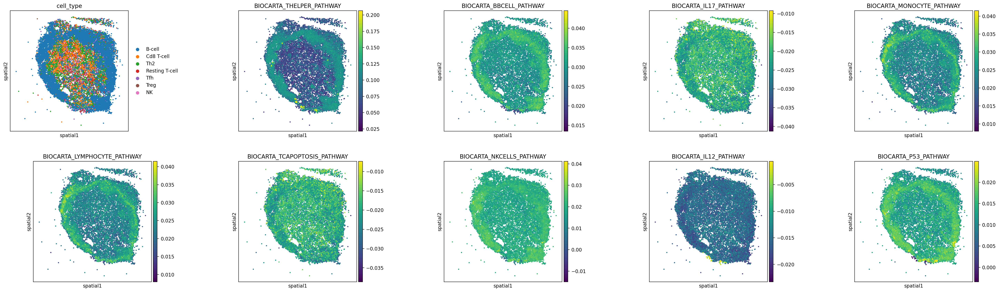

In [ ]:
show_gsea_scores(
    adata_train, delta_gsea_scores, annot='cell_type', n_show=9, 
    savepath=f'/ix/djishnu/shared/djishnu_kor11/results/mLDN3-1_v4/{tf}/gsea.png')

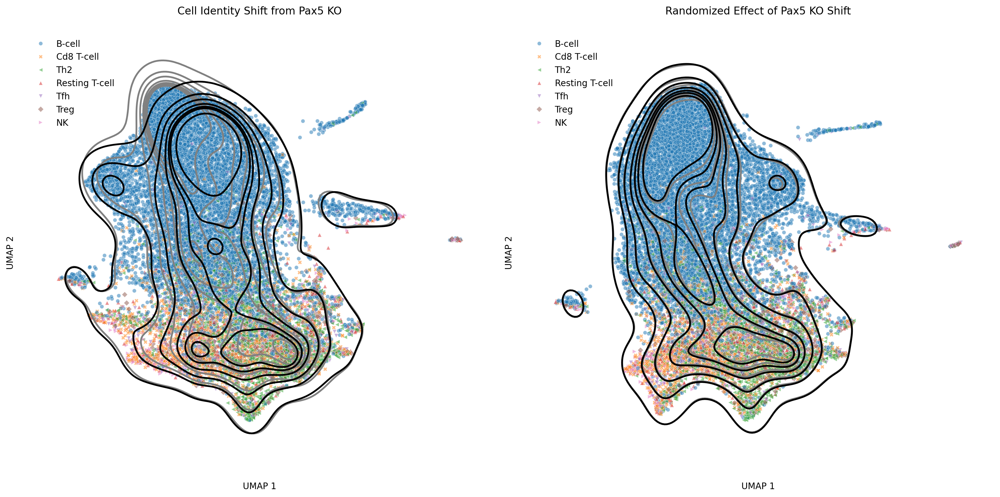

In [ ]:
pro.plot_contour_shift(
    savepath=f'/ix/djishnu/shared/djishnu_kor11/results/mLDN3-1_v4/{tf}/contour.png')

In [8]:
adata = adata_train
adata.obs['cell_type'].value_counts()

cell_type
B-cell            10417
Th2                2150
Cd8 T-cell         1517
Treg                516
Resting T-cell      492
Tfh                 472
NK                  272
Name: count, dtype: int64

In [13]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=10)
sc.tl.umap(adata)